In [32]:
import os
import math
from PIL.Image import open as load_pic, new as new_pic, fromarray
from matplotlib import pyplot as PLT
import numpy as np

chaotic_values = None
ALPHA1 = 2 ** 24
ALPHA2 = ALPHA1 ** 2

In [33]:
def chaotic_polynomial_map(x_n, lambda_):
    ans = (2 * (lambda_ ** 2) * (0.5 - abs(x_n - 0.5))) / (1 + 2 * (lambda_ ** 2 - 1) * (0.5 - abs(x_n - 0.5)))
    return ans

In [34]:
def get_all_chaotic_values(x_0, lambda_, iterations):
    ans = [x_0]
    for i in range(iterations):
        x_0 = chaotic_polynomial_map(x_0, lambda_)
        ans.append(x_0)
    return ans

In [35]:
def create_transformation(N, x_k):
    u = math.floor(x_k * ALPHA1) % N
    v = (math.floor(x_k * ALPHA2) % ALPHA1) % N
    ans = np.array([[1, u], [v, u * v + 1]])
    return ans

In [36]:
def inv(A):
    det = A[0][0] * A[1][1] - A[1][0] * A[0][1]
    ans = np.array([[A[1][1]/det, -A[0][1]/det], [-A[1][0]/det, A[0][0]/det]])
    return ans


In [37]:
def create_Hankel(S):
    n = S.shape[0]
    ans = np.empty((n, n))
    for i in range(n):
        for j in range(n):
            if (i + j < n):
                ans[i][j] = S[i + j]
            else:
                ans[i][j] = 0
    return ans

In [38]:
def chaotic_cat_map(image, iterations):
    counter = 0
    height, width = image.shape[:2]
    while counter < iterations:
        canvas = np.empty(shape = image.shape)
        transformer = create_transformation(height, chaotic_values[counter + 1])
        for x in range(width):
            for y in range(height):
                nx, ny = map(int, transformer @ np.array([x, y]))
                nx %= width
                ny %= height
                canvas[ny][nx] = image[y][x]
        counter += 1
        image = canvas
    return image

In [39]:
def encrypt_Image(image):
    w = np.random.randint(2 ** 8 + 1, 2 ** 16 + 1)
    K_chaotic = np.empty(shape = image.shape[0:2])
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            K_chaotic[i][j] = (np.floor(chaotic_values[i * image.shape[0] + j] * (w + 1)) ** 2)
    U, S, Vh = np.linalg.svd(K_chaotic, full_matrices=False)
    H = create_Hankel(S)
    U, S, Vh = np.linalg.svd(K_chaotic, full_matrices=False)
    K_chaotic = (U @ Vh) % 256
    K_chaotic = K_chaotic.astype(int)
    image = image.astype(int)
    for k in range(3):
        image[0:,0:,k] ^= K_chaotic
    return image, w

In [40]:
def chaotic_cat_map_inverse(image, iterations):
    counter = 0
    height, width = image.shape[:2]
    while counter < iterations:
        canvas = np.empty(shape = image.shape)
        transformer = inv(create_transformation(height, chaotic_values[iterations - counter]))
        for x in range(width):
            for y in range(height):
                nx, ny = map(int, transformer @ np.array([x, y]))
                nx %= width
                ny %= height
                canvas[ny][nx] = image[y][x]
        counter += 1
        image = canvas
    return image

In [41]:
def decrypt_to_scrambled(image, w):
    K_chaotic = np.empty(shape = image.shape[0:2])
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            K_chaotic[i][j] = (np.floor(chaotic_values[i * image.shape[0] + j] * (w + 1)) ** 2)
    U, S, Vh = np.linalg.svd(K_chaotic, full_matrices=False)
    H = create_Hankel(S)
    U, S, Vh = np.linalg.svd(K_chaotic, full_matrices=False)
    K_chaotic = (U @ Vh) % 256
    K_chaotic = K_chaotic.astype(int)
    image = image.astype(int)
    for k in range(3):
        image[0:,0:,k] ^= K_chaotic
    return image

In [42]:
def pic_display(image):
    display(fromarray(np.uint8(image)).convert('RGB'))

Starting Parameters : X_0 = 0.3, lambda = 1.97, Number of iterations = 30
original image:


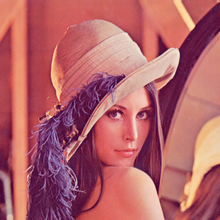

scrambled image:


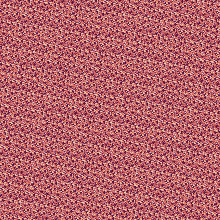

encrypted image:


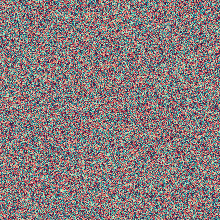

decrypted scrambled image:


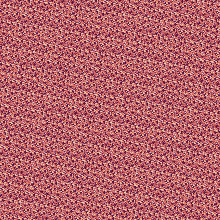

descrambled image:


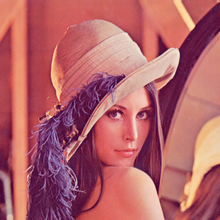

Now we add a very slight error to the parameters to show the strength and sensivity of the encryption
X_0 : 0.3 -> X_1 : 0.30000000000001, lambda : 1.97 -> lambda_prime : 1.97000000000001
decrypted scrambled image with wrong parameters:


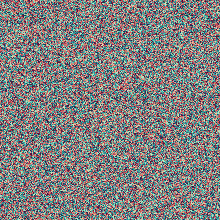

descrambled image with wrong parameters:


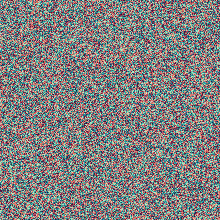

In [43]:
if __name__ == "__main__":
    x_0, lambda_, iterations = 0.3, 1.97, 30
    print(f"Starting Parameters : X_0 = {x_0}, lambda = {lambda_}, Number of iterations = {iterations}")
    path = './Lenna_(test_image).png'
    while not os.path.exists(path):
        path = input("Couldn't find your chosen image, please try again:\n\t")
    original_Image = np.array(load_pic(path))
    print("original image:")
    pic_display(original_Image)
    dim = height, width = original_Image.shape[:2]
    chaotic_values = get_all_chaotic_values(x_0, lambda_, max(iterations, width * height))
    scrambled_Image = chaotic_cat_map(original_Image, iterations)
    print("scrambled image:")
    pic_display(scrambled_Image)
    encrypted_Image, key = encrypt_Image(scrambled_Image)
    print("encrypted image:")
    pic_display(encrypted_Image)
    decrypted_Scrambled_Image = decrypt_to_scrambled(encrypted_Image, key)
    print("decrypted scrambled image:")
    pic_display(decrypted_Scrambled_Image)
    descrambled_Image = chaotic_cat_map_inverse(decrypted_Scrambled_Image, iterations)
    print("descrambled image:")
    pic_display(descrambled_Image)
    print("Now we add a very slight error to the parameters to show the strength and sensivity of the encryption")
    x_1, lambda_prime = x_0 + 0.00000000000001, lambda_ + 0.00000000000001
    chaotic_values = get_all_chaotic_values(x_1, lambda_prime, max(iterations, height * width))
    print(f"X_0 : {x_0} -> X_1 : {x_1}, lambda : {lambda_} -> lambda_prime : {lambda_prime}")
    img = decrypt_to_scrambled(encrypted_Image, key)
    print("decrypted scrambled image with wrong parameters:")
    pic_display(img)
    img = chaotic_cat_map_inverse(img, iterations)
    print("descrambled image with wrong parameters:")
    pic_display(img)

Starting Parameters : X_0 = 0.15, lambda = 5.77, Number of iterations = 5
original image:


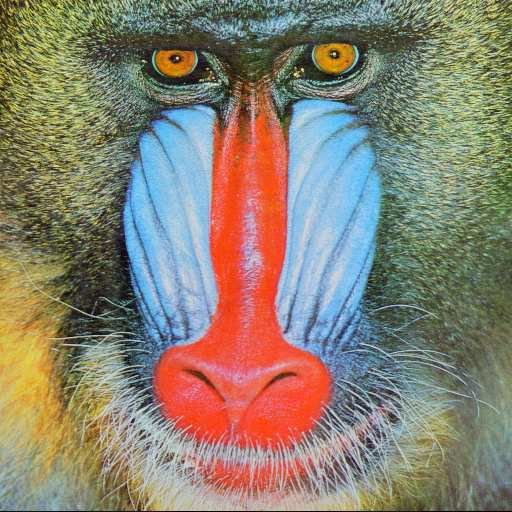

scrambled image:


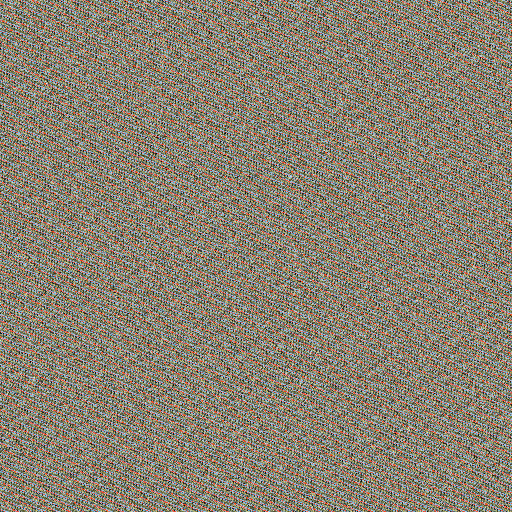

encrypted image:


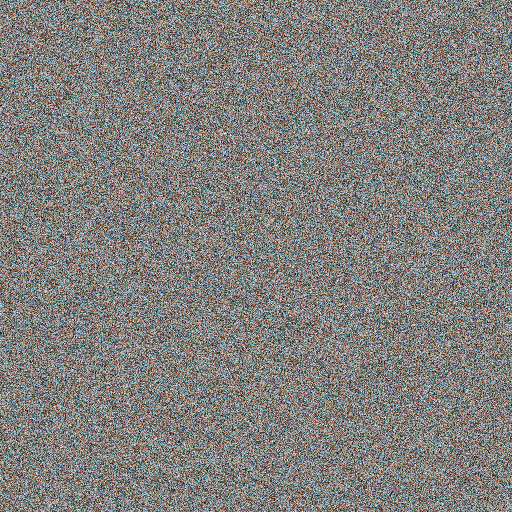

decrypted scrambled image:


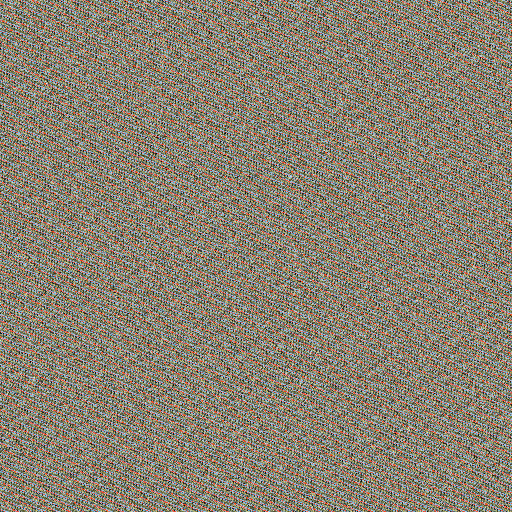

descrambled image:


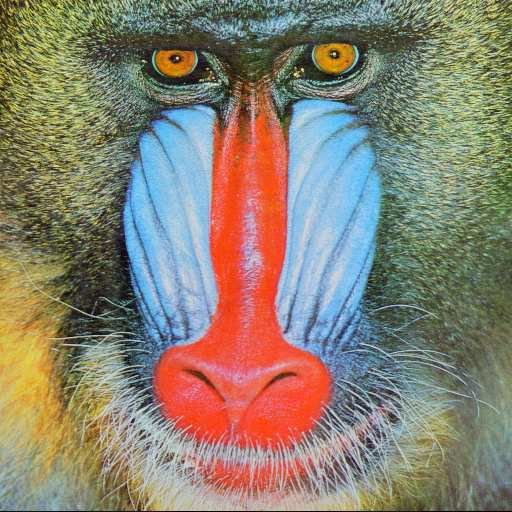

Now we add a very slight error to the parameters to show the strength and sensivity of the encryption
X_0 : 0.15 -> X_1 : 0.15000000000001, lambda : 5.77 -> lambda_prime: 5.770000000000009
decrypted scrambled image with wrong parameters:


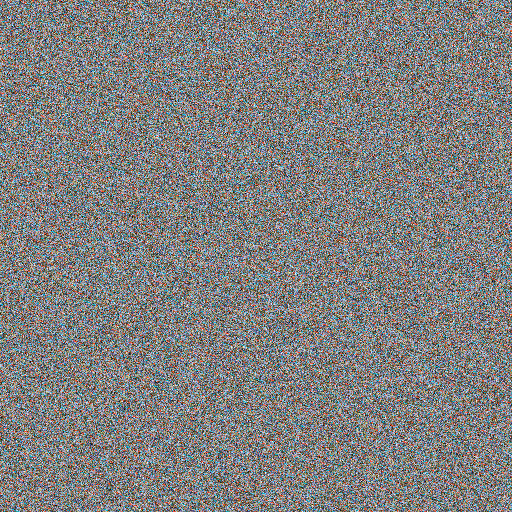

descrambled image with wrong parameters:


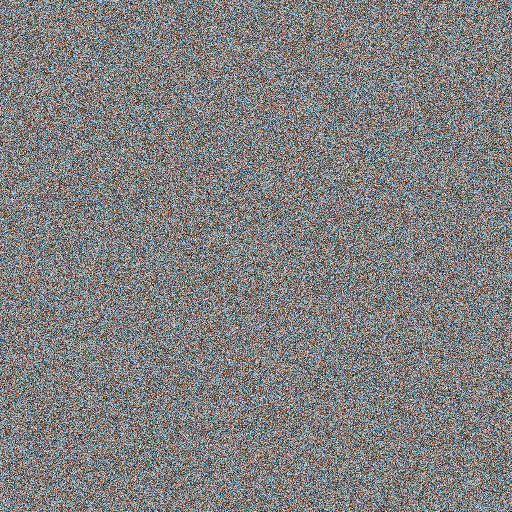

In [44]:
if __name__ == "__main__":
    x_0, lambda_, iterations = 0.15, 5.77, 5
    print(f"Starting Parameters : X_0 = {x_0}, lambda = {lambda_}, Number of iterations = {iterations}")
    path = './baboon.png'
    while not os.path.exists(path):
        path = input("Couldn't find your chosen image, please try again:\n\t")
    original_Image = np.array(load_pic(path))
    print("original image:")
    pic_display(original_Image)
    dim = height, width = original_Image.shape[:2]
    chaotic_values = get_all_chaotic_values(x_0, lambda_, max(iterations, width * height))
    scrambled_Image = chaotic_cat_map(original_Image, iterations)
    print("scrambled image:")
    pic_display(scrambled_Image)
    encrypted_Image, key = encrypt_Image(scrambled_Image)
    print("encrypted image:")
    pic_display(encrypted_Image)
    decrypted_Scrambled_Image = decrypt_to_scrambled(encrypted_Image, key)
    print("decrypted scrambled image:")
    pic_display(decrypted_Scrambled_Image)
    descrambled_Image = chaotic_cat_map_inverse(decrypted_Scrambled_Image, iterations)
    print("descrambled image:")
    pic_display(descrambled_Image)
    print("Now we add a very slight error to the parameters to show the strength and sensivity of the encryption")
    x_1, lambda_prime = x_0 + 0.00000000000001, lambda_ + 0.00000000000001
    chaotic_values = get_all_chaotic_values(x_1, lambda_prime, max(iterations, height * width))
    print(f"X_0 : {x_0} -> X_1 : {x_1}, lambda : {lambda_} -> lambda_prime: {lambda_prime}")
    img = decrypt_to_scrambled(encrypted_Image, key)
    print("decrypted scrambled image with wrong parameters:")
    pic_display(img)
    img = chaotic_cat_map_inverse(img, iterations)
    print("descrambled image with wrong parameters:")
    pic_display(img)

Starting Parameters : X_0 = 0.03, lambda = 3.43, Number of iterations = 10
original image:


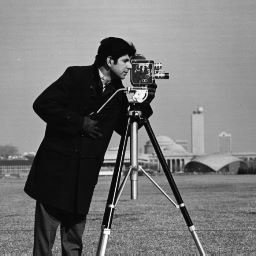

scrambled image:


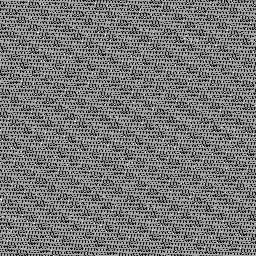

encrypted image:


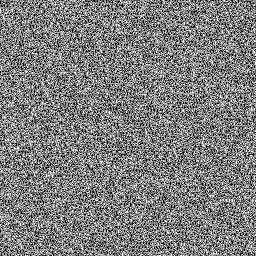

decrypted scrambled image:


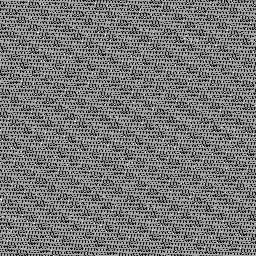

descrambled image:


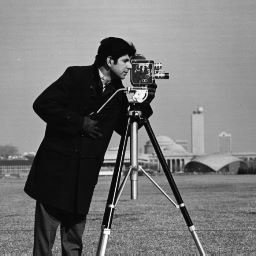

Now we add a very slight error to the parameters to show the strength and sensivity of the encryption
X_0 : 0.03 -> X_1: 0.030000000000009998, lambda : 3.43 -> lambda_prime: 3.4300000000000104
decrypted scrambled image with wrong parameters:


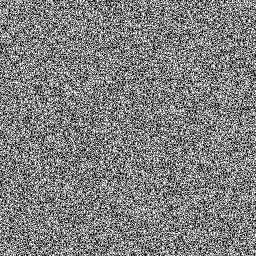

descrambled image with wrong parameters:


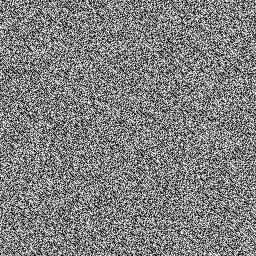

In [46]:
if __name__ == "__main__":
    x_0, lambda_, iterations = 0.03, 3.43, 10
    print(f"Starting Parameters : X_0 = {x_0}, lambda = {lambda_}, Number of iterations = {iterations}")
    path = './cameraman.jpg'
    while not os.path.exists(path):
        path = input("Couldn't find your chosen image, please try again:\n\t")
    original_Image = np.array(load_pic(path))
    print("original image:")
    pic_display(original_Image)
    dim = height, width = original_Image.shape[:2]
    chaotic_values = get_all_chaotic_values(x_0, lambda_, max(iterations, width * height))
    scrambled_Image = chaotic_cat_map(original_Image, iterations)
    print("scrambled image:")
    pic_display(scrambled_Image)
    encrypted_Image, key = encrypt_Image(scrambled_Image)
    print("encrypted image:")
    pic_display(encrypted_Image)
    decrypted_Scrambled_Image = decrypt_to_scrambled(encrypted_Image, key)
    print("decrypted scrambled image:")
    pic_display(decrypted_Scrambled_Image)
    descrambled_Image = chaotic_cat_map_inverse(decrypted_Scrambled_Image, iterations)
    print("descrambled image:")
    pic_display(descrambled_Image)
    print("Now we add a very slight error to the parameters to show the strength and sensivity of the encryption")
    x_1, lambda_prime = x_0 + 0.00000000000001, lambda_ + 0.00000000000001
    chaotic_values = get_all_chaotic_values(x_1, lambda_prime, max(iterations, height * width))
    print(f"X_0 : {x_0} -> X_1: {x_1}, lambda : {lambda_} -> lambda_prime: {lambda_prime}")
    img = decrypt_to_scrambled(encrypted_Image, key)
    print("decrypted scrambled image with wrong parameters:")
    pic_display(img)
    img = chaotic_cat_map_inverse(img, iterations)
    print("descrambled image with wrong parameters:")
    pic_display(img)